In [395]:
import pandas as pd
import sqlite3
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from scipy.stats import ttest_ind, mannwhitneyu

import statsmodels.api as sm
import statsmodels.formula.api as smf

import pandas_profiling 

from sklearn.preprocessing import RobustScaler, OneHotEncoder, StandardScaler, MinMaxScaler

# Airbnb

## Context and objectives

Your have been missioned by the CEO of Airbnb Spain to analyze accommodations park in Madrid. More specifically, you are going to investigate the price of Airbnb accommodations in Madrid from April 2021 to April 2022.

## The database

### Download

Download the database in the `db` directory:

In [1]:
!curl https://wagon-public-datasets.s3.amazonaws.com/certification/airbnb_profits_analysis/airbnb.sqlite > db/airbnb.sqlite

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  306M  100  306M    0     0  11.2M      0  0:00:27  0:00:27 --:--:-- 11.4M9  0:00:05  0:00:24 11.1M0:00:14 11.3M


Check the database has been saved:

In [2]:
!tree

.
├── Makefile
├── README.md
├── airbnb.ipynb
├── data
├── db
│   └── airbnb.sqlite
└── tests
    └── __init__.py

3 directories, 5 files


### Schema

Open the database with your favorite tool (DBeaver, sqlite3, Postico,...) then:
- **📝 Draw the database schema in Le Wagon editor on https://kitt.lewagon.com/db**
- **💾 Save the `XML` version of the database schema in a `db/airbnb.xml` file**

Once done, check you have the `airbnb.xml` file in the `db` directory:

In [191]:
!tree

### Querying the database

In order to perform some analysis, you need to fetch the following information from **all** the accommodations of the database:
- `id`: the unique identifier of the accommodation
- `price`: the value paid per night in USD
- `neighbourhood`: the neighbourhood the accommodation belongs to
- `neighbourhood_group`: the neighbourhoods group the accommodation belongs to
- `bedrooms`: the number of bedrooms 
- `beds`: the number of beds
- `accommodates`: number of persons the accommodation is suited for
- `amenities`: a list of amenities of the accommodation
- `minimum_nights`: the minimum number of nights which can be booked
- `maximum_nights`: the maximum number of nights which can be booked in a row
- `host_id`: the unique identifier of the host
- `host_since`: date of the first listing of the host
- `host_neighbourhood`: the neighbourhood the accommodation belongs to
- `host_location`: the location of the host
- `host_response_time`: the category of response time of the host
- `host_response_rate`: the response rate of the host in %
- `host_acceptance_rate`: the acceptance rate of the host in %
- `host_is_superhost`: whether or not the host is a Superhost
- `host_has_profile_pic`: whether or not the host has a profile picture
- `host_identity_verified`: whether or not the identity of the host is verified
- `latitude`: latitude of the accommodation
- `longitude`: longitude of the accommodation
- `room_type`: category of the accommodation
- `property_type`: category of the property the accommodation belongs to
- `review_scores_rating`: average score rating for the accommodation in %
- `number_of_reviews`: total number of reviews
- `yearly_availability`: the total number of days where the accommodation available for guests in a year

**📝 Write an SQL query to fetch the above information and store it as a `str` in the `query` variable.**

In [441]:
# YOUR CODE HERE

query = """
    WITH avai AS (
        SELECT a2.accommodation_id , COUNT(a2.available) as yearly_availability
        FROM availabilities a2 
        WHERE a2.available == "t"
        GROUP BY a2.accommodation_id
    ) 
    SELECT a.id, a.price, 
    n.name , ng.name , 
    a.bedrooms, a.beds, a.accommodates,
    a.amenities, a.minimum_nights, a.maximum_nights,
    a.host_id , a.host_since , a.host_neighbourhood , a.host_location,
    a.host_response_time , a.host_response_rate , a.host_acceptance_rate,
    a.host_is_superhost , a.host_has_profile_pic , a.host_identity_verified ,
    a.latitude , a.longitude , a.room_type , a.property_type ,
    a.review_scores_rating ,
    COUNT(r.id) AS number_of_reviews,
    av.yearly_availability
    FROM accommodations a 
    LEFT JOIN reviews r ON a.id = r.accommodation_id 
    JOIN neighbourhoods n ON a.neighbourhood_id = n.id 
    JOIN neighbourhood_groups ng ON n.neighbourhood_group_id = ng.id 
    LEFT JOIN avai av ON a.id = av.accommodation_id 
    GROUP BY a.id
"""

**📝 Connect to the `airbnb.sqlite` database and use the query above to store the data in a `DataFrame` named `data`. Display the 10 first rows**

In [442]:
# YOUR CODE HERE

conn = sqlite3.connect('/Users/alix/code/lewagon-exams/alixtc-data-airbnb-profits-analysis-challenge-2021-09-28/db/airbnb.sqlite')
c = conn.cursor()
c.execute(query)
names = [description[0] for description in c.description]

database = c.fetchall()


In [443]:
names

['id',
 'price',
 'name',
 'name',
 'bedrooms',
 'beds',
 'accommodates',
 'amenities',
 'minimum_nights',
 'maximum_nights',
 'host_id',
 'host_since',
 'host_neighbourhood',
 'host_location',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_has_profile_pic',
 'host_identity_verified',
 'latitude',
 'longitude',
 'room_type',
 'property_type',
 'review_scores_rating',
 'number_of_reviews',
 'yearly_availability']

In [444]:
data = pd.DataFrame(database)
data.columns = names
data

,id,price,name,name,bedrooms,beds,accommodates,amenities,minimum_nights,maximum_nights,...,host_is_superhost,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,property_type,review_scores_rating,number_of_reviews,yearly_availability
0,6369,$60.00,Hispanoamérica,Chamartín,1.0,1.0,2,"[""Kitchen"", ""Elevator"", ""Extra pillows and bla...",1,1125,...,t,t,t,40.45724,-3.67688,Private room,Private room in apartment,98.0,78,180.0
1,21853,$31.00,Cármenes,Latina,1.0,1.0,1,"[""Bed linens"", ""Refrigerator"", ""Dishes and sil...",4,40,...,f,t,t,40.40381,-3.74130,Private room,Private room in apartment,92.0,33,364.0
2,23001,$50.00,Legazpi,Arganzuela,3.0,5.0,6,"[""Pool"", ""Dishwasher"", ""Bed linens"", ""Refriger...",15,730,...,f,t,t,40.38840,-3.69511,Entire home/apt,Entire apartment,NaN,0,366.0
3,24805,$92.00,Universidad,Centro,NaN,1.0,3,"[""Refrigerator"", ""Host greets you"", ""Dishes an...",5,730,...,f,t,f,40.42183,-3.70529,Entire home/apt,Entire apartment,98.0,10,72.0
4,26825,$26.00,Legazpi,Arganzuela,1.0,1.0,1,"[""Elevator"", ""Patio or balcony"", ""Bed linens"",...",2,1125,...,f,t,t,40.38975,-3.69018,Private room,Private room in house,94.0,149,365.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19613,49185822,$23.00,Embajadores,Centro,1.0,1.0,1,"[""Kitchen"", ""Lock on bedroom door"", ""Oven"", ""D...",30,1125,...,f,t,t,40.40756,-3.69937,Private room,Private room in apartment,NaN,0,349.0
19614,49186179,$21.00,Gaztambide,Chamberí,1.0,1.0,1,"[""Kitchen"", ""Wifi"", ""Cooking basics"", ""Hot wat...",30,1125,...,f,t,t,40.43706,-3.71364,Private room,Private room in apartment,NaN,0,350.0
19615,49187258,$22.00,Arapiles,Chamberí,1.0,1.0,1,"[""Kitchen"", ""Toaster"", ""Oven"", ""Lock on bedroo...",7,1125,...,f,t,t,40.43857,-3.70715,Private room,Private room in apartment,NaN,0,364.0
19616,49187471,$19.00,Guindalera,Salamanca,1.0,1.0,1,"[""Kitchen"", ""Toaster"", ""Lock on bedroom door"",...",30,1125,...,f,t,t,40.43027,-3.66759,Private room,Private room in apartment,NaN,0,349.0


### 💾 Save your results

Run the cell below to save your results.

In [445]:
from nbresult import ChallengeResult
result = ChallengeResult(
    'query',
    query=query,
    shape=data.shape,
    columns=data.columns,
    host_locations=data['host_location'].unique(),
    maximums=data.max(axis=0),
    minimums=data.min(axis=0),
    means=data.mean(axis=0)
)
result.write()

/var/folders/_5/s9wbxcy503dggw34b98btk9c0000gp/T/ipykernel_7799/3634933146.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  maximums=data.max(axis=0),
/var/folders/_5/s9wbxcy503dggw34b98btk9c0000gp/T/ipykernel_7799/3634933146.py:9: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  minimums=data.min(axis=0),
/var/folders/_5/s9wbxcy503dggw34b98btk9c0000gp/T/ipykernel_7799/3634933146.py:10: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  means=data.mean(axis=0)


### Load data from a CSV file

We provide you a clean dataset you should start withto perform your analysis:

**📝 Load the data from this URL: https://wagon-public-datasets.s3.amazonaws.com/certification/airbnb_profits_analysis/airbnb.csv inside a `DataFrame` named `accommodations`. Display the 10 first rows.** 

In [408]:
# YOUR CODE HERE
accommodations = pd.read_csv('data/airbnb.csv')

In [202]:
accommodations.head(10)

,id,price,neighbourhood,neighbourhood_group,bedrooms,beds,accommodates,amenities,minimum_nights,maximum_nights,...,host_is_superhost,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,property_type,review_scores_rating,number_of_reviews,yearly_availability
0,6369,$60.00,Hispanoamérica,Chamartín,1.0,1.0,2,"[""Kitchen"", ""Elevator"", ""Extra pillows and bla...",1,1125,...,t,t,t,40.45724,-3.67688,Private room,Private room in apartment,98.0,78,180.0
1,21853,$31.00,Cármenes,Latina,1.0,1.0,1,"[""Bed linens"", ""Refrigerator"", ""Dishes and sil...",4,40,...,f,t,t,40.40381,-3.74130,Private room,Private room in apartment,92.0,33,364.0
2,23001,$50.00,Legazpi,Arganzuela,3.0,5.0,6,"[""Pool"", ""Dishwasher"", ""Bed linens"", ""Refriger...",15,730,...,f,t,t,40.38840,-3.69511,Entire home/apt,Entire apartment,NaN,0,366.0
3,26825,$26.00,Legazpi,Arganzuela,1.0,1.0,1,"[""Elevator"", ""Patio or balcony"", ""Bed linens"",...",2,1125,...,f,t,t,40.38975,-3.69018,Private room,Private room in house,94.0,149,365.0
4,28200,$85.00,Legazpi,Arganzuela,3.0,4.0,6,"[""TV with standard cable"", ""Kitchen"", ""Elevato...",1,365,...,f,t,t,40.38860,-3.69492,Entire home/apt,Entire apartment,80.0,3,365.0
5,30320,$65.00,Sol,Centro,1.0,2.0,2,"[""TV with standard cable"", ""Heating"", ""Air con...",5,180,...,f,t,f,40.41476,-3.70418,Entire home/apt,Entire apartment,93.0,170,351.0
6,30959,$54.00,Embajadores,Centro,1.0,1.0,2,"[""TV with standard cable"", ""Kitchen"", ""Elevato...",3,730,...,f,t,f,40.41259,-3.70105,Entire home/apt,Entire loft,88.0,8,NaN
7,37859,"$1,400.00",Palacio,Centro,2.0,3.0,5,"[""Kitchen"", ""Elevator"", ""Dryer"", ""Iron"", ""Wifi...",3,730,...,t,t,t,40.41844,-3.71073,Entire home/apt,Entire apartment,NaN,0,365.0
8,40718,$79.00,Justicia,Centro,1.0,2.0,4,"[""Bed linens"", ""Refrigerator"", ""Crib"", ""Dishes...",3,500,...,t,t,t,40.41969,-3.69736,Entire home/apt,Entire apartment,93.0,118,302.0
9,40916,$90.00,Universidad,Centro,1.0,3.0,3,"[""Kitchen"", ""Elevator"", ""Wifi"", ""Heating"", ""Lo...",5,180,...,f,t,f,40.42247,-3.70577,Entire home/apt,Entire apartment,93.0,48,346.0


## Exploratory analysis

In this section, explore the dataset and visualize the data to get some intuitions.

In particular, try to make a sense of the relationships between the price of an accommodation and its characteristics.


ℹ️ We are **not** waiting for multivariate analysis at this point (using the `statsmodels` package)

In [203]:
# YOUR CODE HERE
accommodations.isnull().sum()

id                           0
price                        0
neighbourhood                0
neighbourhood_group          0
bedrooms                     0
beds                         0
accommodates                 0
amenities                    0
minimum_nights               0
maximum_nights               0
host_id                      0
host_since                 479
host_neighbourhood        6142
host_location              518
host_response_time        7705
host_response_rate        7705
host_acceptance_rate      7805
host_is_superhost          479
host_has_profile_pic       479
host_identity_verified     479
latitude                     0
longitude                    0
room_type                    0
property_type                0
review_scores_rating      5185
number_of_reviews            0
yearly_availability       4557
dtype: int64

In [380]:
accommodations.drop_duplicates()

,id,price,neighbourhood,neighbourhood_group,bedrooms,beds,accommodates,amenities,minimum_nights,maximum_nights,...,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,property_type,review_scores_rating,number_of_reviews,yearly_availability,revenue
0,6369,60.0,Hispanoamérica,Chamartín,1.0,1.0,2,"[""Kitchen"", ""Elevator"", ""Extra pillows and bla...",1,1125,...,True,True,40.45724,-3.67688,Private room,Private room in apartment,98.0,78,180.0,657.00
1,21853,31.0,Cármenes,Latina,1.0,1.0,1,"[""Bed linens"", ""Refrigerator"", ""Dishes and sil...",4,40,...,True,True,40.40381,-3.74130,Private room,Private room in apartment,92.0,33,364.0,339.45
2,23001,50.0,Legazpi,Arganzuela,3.0,5.0,6,"[""Pool"", ""Dishwasher"", ""Bed linens"", ""Refriger...",15,730,...,True,True,40.38840,-3.69511,Entire home/apt,Entire apartment,NaN,0,366.0,547.50
3,26825,26.0,Legazpi,Arganzuela,1.0,1.0,1,"[""Elevator"", ""Patio or balcony"", ""Bed linens"",...",2,1125,...,True,True,40.38975,-3.69018,Private room,Private room in house,94.0,149,365.0,284.70
4,28200,85.0,Legazpi,Arganzuela,3.0,4.0,6,"[""TV with standard cable"", ""Kitchen"", ""Elevato...",1,365,...,True,True,40.38860,-3.69492,Entire home/apt,Entire apartment,80.0,3,365.0,930.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17742,49184441,40.0,Puerta del Angel,Latina,2.0,2.0,2,"[""Kitchen"", ""Hangers"", ""Wifi"", ""Heating"", ""Coo...",30,1125,...,True,True,40.41271,-3.73336,Entire home/apt,Entire apartment,NaN,0,365.0,438.00
17743,49185822,23.0,Embajadores,Centro,1.0,1.0,1,"[""Kitchen"", ""Lock on bedroom door"", ""Oven"", ""D...",30,1125,...,True,True,40.40756,-3.69937,Private room,Private room in apartment,NaN,0,349.0,251.85
17744,49186179,21.0,Gaztambide,Chamberí,1.0,1.0,1,"[""Kitchen"", ""Wifi"", ""Cooking basics"", ""Hot wat...",30,1125,...,True,True,40.43706,-3.71364,Private room,Private room in apartment,NaN,0,350.0,229.95
17745,49187258,22.0,Arapiles,Chamberí,1.0,1.0,1,"[""Kitchen"", ""Toaster"", ""Oven"", ""Lock on bedroo...",7,1125,...,True,True,40.43857,-3.70715,Private room,Private room in apartment,NaN,0,364.0,240.90


In [409]:
# Convert data types
accommodations.price = [float(pr[1:].replace(',', '')) for pr in accommodations.price]

accommodations.host_since = pd.to_datetime(accommodations.host_since)

#accommodations.host_is_superhost = accommodations.host_is_superhost == 't'
#accommodations.host_has_profile_pic = accommodations.host_has_profile_pic == 't'
#accommodations.host_identity_verified = accommodations.host_identity_verified == 't'

accommodations.host_response_rate = [float(str(elm).replace('%', '')) for elm in accommodations.host_response_rate]
accommodations.host_acceptance_rate = [float(str(elm).replace('%', '')) for elm in accommodations.host_acceptance_rate]

In [206]:
accommodations.select_dtypes('number').corr()

,id,price,bedrooms,beds,accommodates,minimum_nights,maximum_nights,host_id,host_response_rate,host_acceptance_rate,latitude,longitude,review_scores_rating,number_of_reviews,yearly_availability
id,1.000000,-0.001514,0.030088,0.014665,0.010899,-0.014939,-0.016380,0.582464,-0.080225,0.049295,0.007663,0.046718,-0.082488,-0.452042,-0.019654
price,-0.001514,1.000000,0.144091,0.089991,0.128685,0.019334,0.077719,-0.006022,-0.026328,0.032996,0.005668,0.031940,0.008758,-0.000245,-0.024028
bedrooms,0.030088,0.144091,1.000000,0.665069,0.686119,0.000642,0.011139,0.008924,0.026485,-0.002494,0.027837,-0.003500,0.014459,0.016290,-0.005032
beds,0.014665,0.089991,0.665069,1.000000,0.764143,-0.015137,0.017408,0.022244,0.026468,0.024074,0.024820,-0.031964,-0.014008,0.049815,-0.004215
accommodates,0.010899,0.128685,0.686119,0.764143,1.000000,-0.027879,0.024963,0.010728,0.090666,0.086410,0.008260,-0.049244,-0.025704,0.109479,-0.019961
minimum_nights,-0.014939,0.019334,0.000642,-0.015137,-0.027879,1.000000,0.007349,-0.020091,-0.037049,-0.108126,0.006035,-0.019029,0.006478,-0.031416,0.035461
maximum_nights,-0.016380,0.077719,0.011139,0.017408,0.024963,0.007349,1.000000,-0.012643,0.000905,-0.008644,0.013965,-0.025801,-0.006431,0.012614,0.011760
host_id,0.582464,-0.006022,0.008924,0.022244,0.010728,-0.020091,-0.012643,1.000000,-0.135568,0.014351,-0.022561,0.037200,-0.112346,-0.257091,0.023619
host_response_rate,-0.080225,-0.026328,0.026485,0.026468,0.090666,-0.037049,0.000905,-0.135568,1.000000,0.454056,0.026152,-0.040364,0.134820,0.166858,-0.065895
host_acceptance_rate,0.049295,0.032996,-0.002494,0.024074,0.086410,-0.108126,-0.008644,0.014351,0.454056,1.000000,-0.037741,-0.020932,0.010460,0.137182,-0.100135


[None]

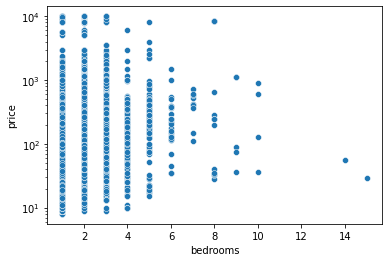

In [207]:
splot = sns.scatterplot(data=accommodations, x='bedrooms', y='price')
splot.set(yscale='log')

[None]

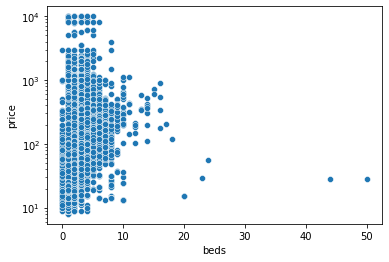

In [208]:
splot = sns.scatterplot(data=accommodations, x='beds', y='price')
splot.set(yscale='log')

<AxesSubplot:xlabel='accommodates', ylabel='price'>

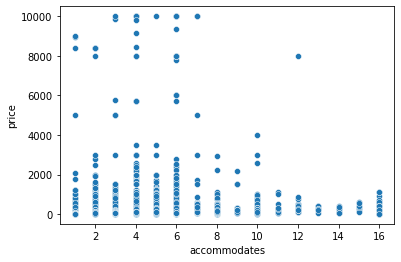

In [209]:
sns.scatterplot(data=accommodations, x='accommodates', y='price')

<AxesSubplot:xlabel='minimum_nights', ylabel='price'>

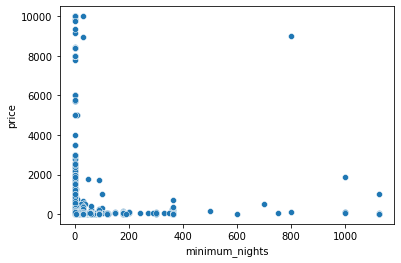

In [210]:
sns.scatterplot(data=accommodations, x='minimum_nights', y='price')

<AxesSubplot:xlabel='maximum_nights', ylabel='price'>

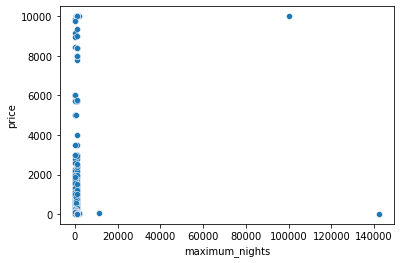

In [211]:
sns.scatterplot(data=accommodations, x='maximum_nights', y='price')

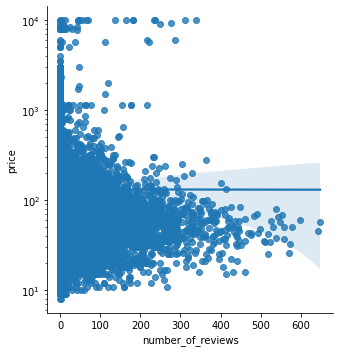

In [212]:
splot = sns.lmplot(data=accommodations, x='number_of_reviews', y='price')
splot.set(yscale='log')

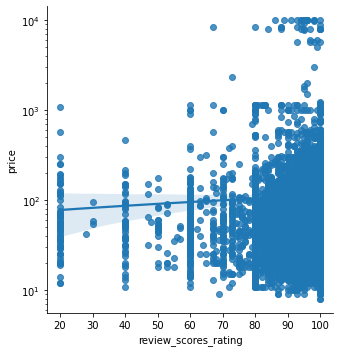

In [213]:
splot = sns.lmplot(data=accommodations, x='review_scores_rating', y='price')
splot.set(yscale='log')

In [214]:
accommodations.isnull().sum()

id                           0
price                        0
neighbourhood                0
neighbourhood_group          0
bedrooms                     0
beds                         0
accommodates                 0
amenities                    0
minimum_nights               0
maximum_nights               0
host_id                      0
host_since                 479
host_neighbourhood        6142
host_location              518
host_response_time        7705
host_response_rate        7705
host_acceptance_rate      7805
host_is_superhost            0
host_has_profile_pic         0
host_identity_verified       0
latitude                     0
longitude                    0
room_type                    0
property_type                0
review_scores_rating      5185
number_of_reviews            0
yearly_availability       4557
dtype: int64

<AxesSubplot:>

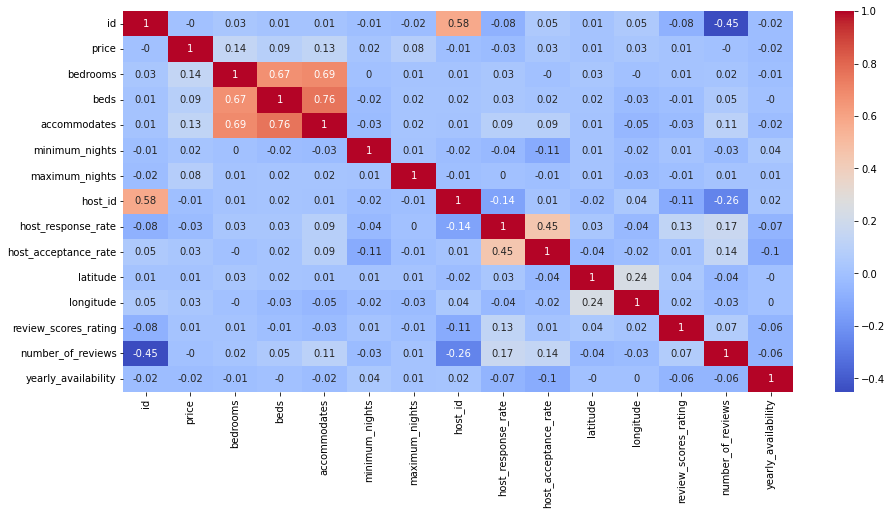

In [215]:
plt.figure(figsize=(15, 7))
sns.heatmap(round(accommodations.select_dtypes('number').corr(), 2), cmap='coolwarm', annot=True)

In [216]:
accommodations.select_dtypes('object').describe()

,neighbourhood,neighbourhood_group,amenities,host_neighbourhood,host_location,host_response_time,room_type,property_type
count,17747,17747,17747,11605,17229,10042,17747,17747
unique,128,21,15486,123,674,4,4,67
top,Embajadores,Centro,"[""Kitchen"", ""Smoke alarm"", ""Dryer"", ""Hangers"",...",Malasaña,"Madrid, Community of Madrid, Spain",within an hour,Entire home/apt,Entire apartment
freq,2081,7780,56,1037,10983,5815,10148,8842


In [217]:
accommodations.host_response_time.unique(), accommodations.room_type.unique()

(array(['within an hour', nan, 'a few days or more', 'within a few hours',
        'within a day'], dtype=object),
 array(['Private room', 'Entire home/apt', 'Shared room', 'Hotel room'],
       dtype=object))

In [11]:
accommodations.profile_report()

Summarize dataset:   0%|          | 0/40 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Statistical analysis

These analysis can help you to forge your presentation but you are **strongly encouraged** to follow your own findings.

### Hotel room statistics

The Airbnb team is really interested in the **Hotel rooms** so you will have to answer some questions about it. 

To do so, we are considering a binary segmentation: **Hotel rooms vs the rest**.

**❓ Using a statistical test, can you tell than Hotel rooms are statistically more expensive than the other rooms?**

Store the $p\text{-}value$ of your test inside a `p_value` variable.

<AxesSubplot:ylabel='price'>

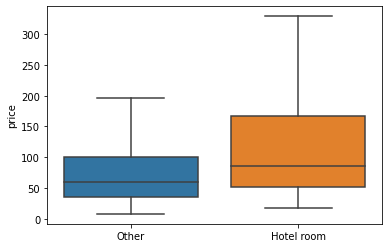

In [218]:
# YOUR CODE HERE
binary_target = [elm if elm == "Hotel room" else 'Other' for elm in accommodations.room_type]


sns.boxplot(x=binary_target, y=accommodations.price, showfliers=False)

In [219]:
hotel_price = accommodations.price[accommodations.room_type == 'Hotel room']
print(hotel_price.shape)
other_price = accommodations.price[accommodations.room_type != 'Hotel room']
print(other_price.shape)

(152,)
(17595,)


In [221]:
p_value = ttest_ind(hotel_price, other_price)[1]
p_value

1.94273641108715e-09

### Price room analysis

**❓ Plot the distribution of the prices?**

ℹ️ Use the accommodations with price lower than $200 for a better visualization

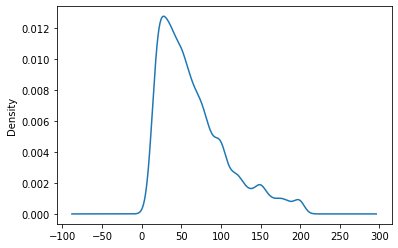

In [31]:
# YOUR CODE HERE
prices = accommodations[accommodations.price <= 200].price
prices.plot.kde();

**❓ What do think about that distribution?**

The distribution is not gaussian, it is skewed to the left, meaning that the most frequent value (the mode) is located before the median

**📝 What transformation would you use to the price to fit a linear model? Transform your target as you see fit.**

1.810255660046073


<AxesSubplot:xlabel='price', ylabel='Count'>

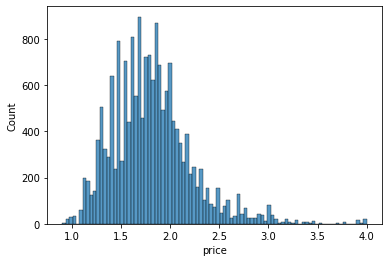

In [222]:
# YOUR CODE HERE
print(np.log10(accommodations.price).mean())
y = np.log10(accommodations.price)
sns.histplot(np.log10(accommodations.price))


**❓ Can we explain the price for a customer with our features?**

Using the numerical and the categorical features of your choice, try to fit a not too complex model to explain the price of an accommodation.

Store the `summary` of the model inside a `model_summary` variable.

In [225]:
# Possible features of interest
feature_names = ['bedrooms', 'beds', 'accommodates', 'minimum_nights', 
                 'maximum_nights','host_is_superhost', 'host_has_profile_pic',
                 'host_identity_verified','room_type','number_of_reviews']

In [385]:
# Subset dataframe with features
X = accommodations[feature_names]
#X_ohe = X.select_dtypes(exclude=[np.number])
X = X.select_dtypes('number')



In [227]:
# Check for colinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

df = pd.DataFrame()
df["vif_index"] = [vif(X.values, i) for i in range(X.shape[1])]
df["features"] = X.columns
df


,vif_index,features
0,6.879809,bedrooms
1,6.837785,beds
2,9.472294,accommodates
3,1.029627,minimum_nights
4,1.216851,maximum_nights
5,1.239247,number_of_reviews


In [386]:
# Remove colinear features
X.drop(['accommodates'], axis=1, inplace=True)

In [387]:
# Standardize
X = X.apply(lambda x: (x- x.mean())/x.std())

# Add intercept
X['intercept'] = 1
X

,bedrooms,beds,minimum_nights,maximum_nights,number_of_reviews,intercept
0,-0.537967,-0.633022,-0.165217,0.278211,0.724242,1
1,-0.537967,-0.633022,-0.076814,-0.500517,0.014046,1
2,1.857843,1.902207,0.247332,-0.005289,-0.506764,1
3,-0.537967,-0.633022,-0.135749,0.278211,1.844773,1
4,1.857843,1.268400,-0.165217,-0.267258,-0.459418,1
...,...,...,...,...,...,...
17742,0.659938,0.000786,0.689350,0.278211,-0.506764,1
17743,-0.537967,-0.633022,0.689350,0.278211,-0.506764,1
17744,-0.537967,-0.633022,0.689350,0.278211,-0.506764,1
17745,-0.537967,-0.633022,0.011590,0.278211,-0.506764,1


In [432]:
# First linear regression
lin_reg = sm.OLS(y, X).fit()

model_summary = lin_reg.summary()

model_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.169
Model:                            OLS   Adj. R-squared:                  0.169
Method:                 Least Squares   F-statistic:                     720.8
Date:                Tue, 28 Sep 2021   Prob (F-statistic):               0.00
Time:                        17:55:32   Log-Likelihood:                -7482.2
No. Observations:               17747   AIC:                         1.498e+04
Df Residuals:                   17741   BIC:                         1.502e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
bedrooms              0.1170      0.004     31.550      0.000       0.110       0.124
beds                  0.0618      0.004     16.635      0.000       0.055       0.069
minimum_nights       -0.0063      0.003     -2.266      0.023      -0.012      -0.001
maximum_nights        0.0070      0.003      2.537      0.011       0.002       0.012
number_of_reviews    -0.0252      0.003     -9.090      0.000      -0.031      -0.020
intercept             1.8103      0.003    653.681      0.000       1.805       1.816
==============================================================================
Omnibus:                     4349.403   Durbin-Watson:                   1.510
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            19057.236
Skew:                           1.139   Prob(JB):                         0.00
Kurtosis:                       7.537   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [434]:
# Linear regression with categorical features
dummy = pd.get_dummies(accommodations[['host_identity_verified','room_type']], drop_first=True)

X2 = pd.concat([X, dummy], axis=1)
lin_reg = sm.OLS(y, X2).fit()

model_summary = lin_reg.summary()

model_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.294
Model:                            OLS   Adj. R-squared:                  0.293
Method:                 Least Squares   F-statistic:                     819.0
Date:                Tue, 28 Sep 2021   Prob (F-statistic):               0.00
Time:                        17:56:36   Log-Likelihood:                -6039.3
No. Observations:               17747   AIC:                         1.210e+04
Df Residuals:                   17737   BIC:                         1.218e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
bedrooms                     0.0811      0.004     22.972      0.000       0.074       0.088
beds                         0.0397      0.004     10.924      0.000       0.033       0.047
minimum_nights              -0.0085      0.003     -3.345      0.001      -0.014      -0.004
maximum_nights               0.0034      0.003      1.330      0.184      -0.002       0.008
number_of_reviews           -0.0397      0.003    -15.211      0.000      -0.045      -0.035
intercept                    1.9850      0.006    352.889      0.000       1.974       1.996
host_identity_verified_t    -0.0638      0.006    -11.103      0.000      -0.075      -0.053
room_type_Hotel room         0.1026      0.028      3.679      0.000       0.048       0.157
room_type_Private room      -0.3063      0.006    -52.340      0.000      -0.318      -0.295
room_type_Shared room       -0.4577      0.020    -22.759      0.000      -0.497      -0.418
==============================================================================
Omnibus:                     7037.585   Durbin-Watson:                   1.450
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            37769.553
Skew:                           1.847   Prob(JB):                         0.00
Kurtosis:                       9.119   Cond. No.                         14.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**❓ What features explain the best the price of an accommodation in Madrid?**
- Which ones are the most statistically significant?
- Which numerical feature is the most sensitive to the price?

In [435]:
# P-values associated with each explanatory variable
lin_reg.pvalues

bedrooms                    4.263488e-115
beds                         1.089929e-27
minimum_nights               8.254728e-04
maximum_nights               1.836127e-01
number_of_reviews            6.325753e-52
intercept                    0.000000e+00
host_identity_verified_t     1.502982e-28
room_type_Hotel room         2.350955e-04
room_type_Private room       0.000000e+00
room_type_Shared room       4.861329e-113
dtype: float64

- We can see that the explanatory variable with the most significant p-value is `bedrooms` and `room_type_Shared room` as illustrated in the cell above.

- In contrast, numerical features that have the most impact on the price are `bedrooms` and `room_type_Hotel room` as shown in the model summary. They have the highest coefficient in the linear regression.

**❓ Explain with your own words the impact of an increase of one unity of the feature of your choice on the price of an accommodation.**

Since the `bedrooms` values are scaled, an associated coefficient of ~0.08 indicates that for an increase of 1 standard deviation of `bedrooms`, the y value will increase by 0.08.

As y is a log10 value of a price, it will correspond to a actual increase in price of 10^0.08, meaning approximately 1.20$

**❓ Are you satisfied with your model? Why?**

As shown below, the distribution of the residuals does not appear to follow a gaussian distribution, as the extremities diverge in the QQplot. Thus the coefficient of the models cannot be fully trusted.

/Users/alix/.pyenv/versions/3.8.12/envs/certification/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


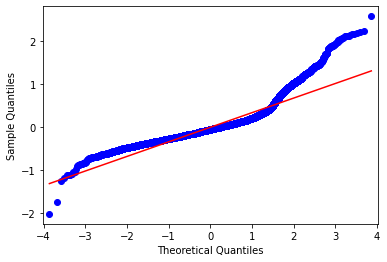

In [439]:
sm.qqplot(lin_reg.resid, line='s');

**❓Are you confident in the p-values of your model?**

For the same reason as above, the p-values of the model might not be accurate.

### 💾 Save your results

Run the cell below to save your results.

In [440]:
from nbresult import ChallengeResult

result = ChallengeResult('analysis', p_value=p_value, model_summary=str(model_summary))
result.write()

## CEO question

> **How can we increase the average rating of the accommodations in Madrid to 95% while keeping the revenue as high as possible?**

[BONUS] In addition could you give some advices / quick wins to Airbnb Hosts Team in order to help hosts increasing their accommodation price while onboarding on the platform.

⚠️ We suppose for this study that: 
- An accommodation is booked **60%** of the available time
- Airbnb takes a **5% fee** on the revenue per accommodation
- The actions you will recommend have a _negligible impact_ on the actual charges of Airbnb

In [250]:
accommodations['revenue'] = 365 * 0.6 * accommodations.price * 0.05

[None]

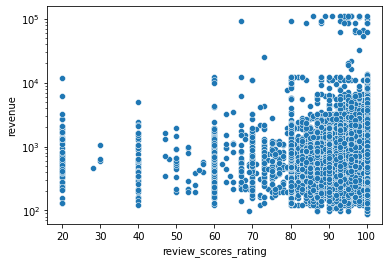

In [255]:
plot = sns.scatterplot(data=accommodations , x='review_scores_rating', y='revenue')
plot.set(yscale='log')

In [402]:
bad_rental = accommodations[accommodations.review_scores_rating<90]

In [403]:
bad_rental

,id,price,neighbourhood,neighbourhood_group,bedrooms,beds,accommodates,amenities,minimum_nights,maximum_nights,...,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,property_type,review_scores_rating,number_of_reviews,yearly_availability,revenue
4,28200,85.0,Legazpi,Arganzuela,3.0,4.0,6,"[""TV with standard cable"", ""Kitchen"", ""Elevato...",1,365,...,True,True,40.38860,-3.69492,Entire home/apt,Entire apartment,80.0,3,365.0,930.75
6,30959,54.0,Embajadores,Centro,1.0,1.0,2,"[""TV with standard cable"", ""Kitchen"", ""Elevato...",3,730,...,True,False,40.41259,-3.70105,Entire home/apt,Entire loft,88.0,8,NaN,591.30
15,70316,75.0,Palacio,Centro,2.0,2.0,3,"[""Bed linens"", ""Refrigerator"", ""Host greets yo...",28,360,...,True,True,40.42191,-3.71038,Entire home/apt,Entire apartment,80.0,7,348.0,821.25
24,93100,45.0,Universidad,Centro,1.0,2.0,3,"[""Dedicated workspace"", ""Backyard"", ""Hangers"",...",1,1125,...,True,True,40.42378,-3.70248,Private room,Private room in apartment,89.0,643,289.0,492.75
42,177846,20.0,Universidad,Centro,1.0,2.0,3,"[""Kitchen"", ""Lock on bedroom door"", ""Wifi"", ""H...",3,1825,...,True,True,40.42399,-3.70389,Private room,Private room in apartment,82.0,61,365.0,219.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17491,48602078,38.0,Gaztambide,Chamberí,1.0,2.0,4,"[""Smoke alarm"", ""Dishwasher"", ""Bed linens"", ""R...",2,365,...,True,True,40.43265,-3.71633,Entire home/apt,Entire apartment,75.0,4,342.0,416.10
17492,48602198,79.0,Palacio,Centro,3.0,3.0,5,"[""Cleaning products"", ""Clothing storage: close...",1,1125,...,True,True,40.41493,-3.70916,Entire home/apt,Entire apartment,84.0,5,290.0,865.05
17496,48604450,96.0,Castillejos,Tetuán,1.0,1.0,4,"[""Kitchen"", ""Free parking on premises"", ""Hange...",7,336,...,True,False,40.46393,-3.69499,Entire home/apt,Entire apartment,60.0,1,183.0,1051.20
17533,48696747,21.0,Vinateros,Moratalaz,1.0,1.0,1,"[""Kitchen"", ""Elevator"", ""Free parking on premi...",2,1125,...,True,False,40.40945,-3.64193,Private room,Private room in apartment,60.0,1,318.0,229.95


(0.0, 1000.0)

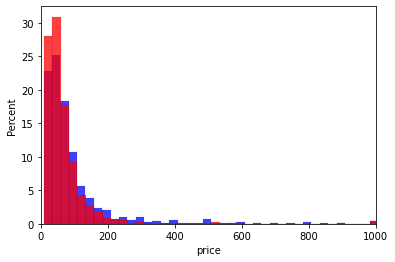

In [404]:
plot = sns.histplot(accommodations.price, color='blue', stat='percent', binwidth=25, legend='whole data')
plot = sns.histplot(bad_rental.price, color='red', stat='percent',binwidth=25, legend='satisfaction < 60')
plot.set_xlim((0, 1000))

(0.0, 5.0)

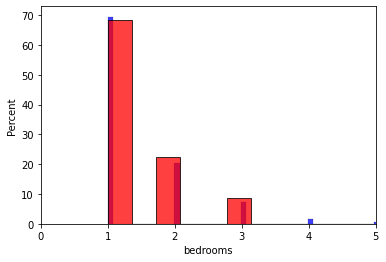

In [292]:
plot = sns.histplot(accommodations.bedrooms, color='blue', stat='percent')
plot = sns.histplot(bad_rental.bedrooms, color='red', stat='percent')
plot.set_xlim((0, 5))

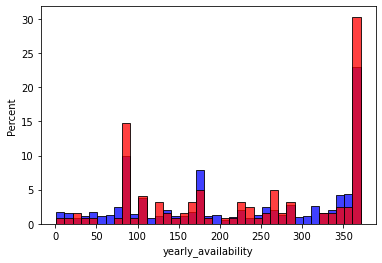

In [286]:
plot = sns.histplot(accommodations.yearly_availability, color='blue', stat='percent', binwidth=10)
plot = sns.histplot(bad_rental.yearly_availability, color='red', stat='percent', binwidth=10)
#plot.set_xlim((0, 1000))

In [309]:
accommodations.query('price<40 & yearly_availability>350').describe()

,id,price,bedrooms,beds,accommodates,minimum_nights,maximum_nights,host_id,host_response_rate,host_acceptance_rate,latitude,longitude,review_scores_rating,number_of_reviews,yearly_availability,revenue
count,1.235000e+03,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1.235000e+03,746.000000,715.000000,1235.000000,1235.000000,849.000000,1235.000000,1235.000000,1235.000000
mean,2.946152e+07,26.431579,1.110121,1.377328,1.791093,10.753846,739.029960,1.425587e+08,72.297587,76.327273,40.417822,-3.690928,91.097762,27.510121,363.279352,289.425789
std,1.464205e+07,7.366036,0.537887,2.128027,1.364074,46.821562,495.522961,1.237459e+08,38.975365,33.308914,0.029105,0.035149,10.899892,59.043858,3.040598,80.658092
min,2.185300e+04,9.000000,1.000000,0.000000,1.000000,1.000000,1.000000,8.217500e+04,0.000000,0.000000,40.340730,-3.784970,20.000000,0.000000,351.000000,98.550000
25%,1.873328e+07,20.000000,1.000000,1.000000,1.000000,1.000000,90.000000,2.344116e+07,38.000000,56.500000,40.397975,-3.709135,87.000000,0.000000,363.000000,219.000000
50%,3.354667e+07,26.000000,1.000000,1.000000,2.000000,2.000000,1125.000000,1.122875e+08,99.000000,98.000000,40.417280,-3.700090,94.000000,3.000000,365.000000,284.700000
75%,4.235683e+07,32.000000,1.000000,1.000000,2.000000,4.000000,1125.000000,2.603600e+08,100.000000,100.000000,40.432720,-3.670185,99.000000,24.500000,365.000000,350.400000
max,4.918726e+07,39.000000,9.000000,50.000000,16.000000,1125.000000,1825.000000,3.959367e+08,100.000000,100.000000,40.514170,-3.558040,100.000000,519.000000,366.000000,427.050000


<AxesSubplot:ylabel='Frequency'>

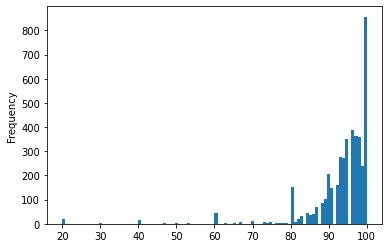

In [318]:
accommodations.query('price>50 & yearly_availability<350 ').review_scores_rating.plot.hist(bins= 100)

In [326]:
accommodations.query('review_scores_rating < 80').sum()

/var/folders/_5/s9wbxcy503dggw34b98btk9c0000gp/T/ipykernel_7799/3820407764.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  accommodations.query('review_scores_rating < 80').sum()


id                                                              19780486551
price                                                               58615.0
neighbourhood             DeliciasGaztambideIbizaPalacioUniversidadCorte...
neighbourhood_group       ArganzuelaChamberíRetiroCentroCentroCentroCham...
bedrooms                                                              800.0
beds                                                                 1182.0
accommodates                                                           1944
amenities                 ["Kitchen", "Elevator", "Smoke alarm", "Fire e...
minimum_nights                                                         2312
maximum_nights                                                       451108
host_id                                                        100982915618
host_response_rate                                                  27981.0
host_acceptance_rate                                                31270.0
host_is_supe

In [374]:
cond = (accommodations.review_scores_rating<90) & (accommodations.revenue<800) #& (accommodations.yearly_availability>340)

In [377]:
cond = (accommodations.review_scores_rating<90) & (accommodations.price<75) #& (accommodations.yearly_availability>340)

In [378]:
accommodations[~cond].describe()

,id,price,bedrooms,beds,accommodates,minimum_nights,maximum_nights,host_id,host_response_rate,host_acceptance_rate,latitude,longitude,review_scores_rating,number_of_reviews,yearly_availability,revenue
count,1.585400e+04,15854.000000,15854.000000,15854.000000,15854.000000,15854.000000,15854.000000,1.585400e+04,8862.000000,8750.000000,15854.000000,15854.000000,10669.000000,15854.000000,11769.000000,15854.000000
mean,2.873878e+07,143.267567,1.475527,2.029078,3.241453,6.725558,732.483600,1.264213e+08,85.535432,83.236457,40.421385,-3.693569,95.038054,31.074808,226.002634,1568.779854
std,1.344730e+07,519.419869,0.851639,1.524451,2.044076,34.422575,1464.662536,1.146387e+08,29.292624,29.386056,0.022781,0.029033,6.850584,61.488035,119.258792,5687.647570
min,6.369000e+03,8.000000,1.000000,0.000000,1.000000,1.000000,1.000000,7.952000e+03,0.000000,0.000000,40.332320,-3.863910,20.000000,0.000000,1.000000,87.600000
25%,1.877231e+07,36.000000,1.000000,1.000000,2.000000,1.000000,83.500000,2.625562e+07,90.000000,80.000000,40.409500,-3.707740,93.000000,0.000000,104.000000,394.200000
50%,3.125118e+07,65.000000,1.000000,2.000000,3.000000,2.000000,1125.000000,9.237096e+07,100.000000,99.000000,40.420050,-3.700840,96.000000,4.000000,235.000000,711.750000
75%,4.029229e+07,110.000000,2.000000,3.000000,4.000000,3.000000,1125.000000,2.177781e+08,100.000000,100.000000,40.430718,-3.683925,100.000000,32.000000,355.000000,1204.500000
max,4.918747e+07,9999.000000,15.000000,24.000000,16.000000,1125.000000,142365.000000,3.964281e+08,100.000000,100.000000,40.562740,-3.531900,100.000000,599.000000,367.000000,109489.050000


In [379]:
accommodations[cond].revenue.sum() / accommodations.revenue.sum() * 100

3.2091404337717413

In [392]:
accommodations[cond].revenue.sum() 

824622.6000000001

**Removing offers with satisfaction < 90% and price < 75 still keeps 97% of revenues with satisfaction > 95%**

<AxesSubplot:xlabel='host_is_superhost', ylabel='review_scores_rating'>

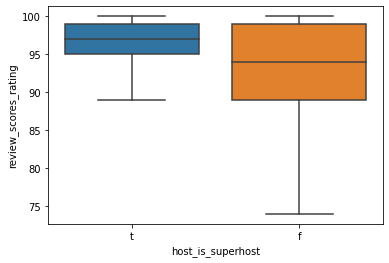

In [431]:
sns.boxplot(data=accommodations, x='host_is_superhost',  y='review_scores_rating', showfliers=False)

## Presentation

Based on the analysis of the `accommodations` dataset, prepare a slides deck to present your conclusions to the CEO of Airbnb Spain. The presentation must contain **5 slides maximum** (including the title slide). 

💡 The CEO is in fond of illustrations, figures and statistics.


ℹ️ You may follow the [pyramid principle](https://gettingbettereveryday.org/2018/10/05/what-you-could-learn-from-barbra-mintos-the-pyramid-principle-2009-172-pages/) with an inductive approach, actions first!


⚠️ Save your presentation at the root of the repository.

🚀 You turn!